<a href="https://colab.research.google.com/github/prajwalbhandari416/Time-Dependent-Wave-Equations/blob/main/Quantum_Field.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# The double pendulum problem

This animation illustrates the double pendulum problem.

Auther: Prajwal Bhandari

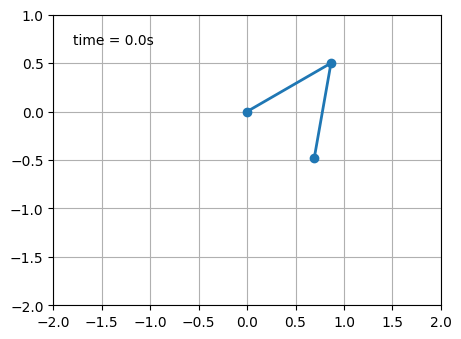

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from numpy import cos, sin

import matplotlib.animation as animation

G = 9.8  # acceleration due to gravity, in m/s^2
L1 = 1.0  # length of pendulum 1 in m
L2 = 1.0  # length of pendulum 2 in m
L = L1 + L2  # maximal length of the combined pendulum
M1 = 1.0  # mass of pendulum 1 in kg
M2 = 1.0  # mass of pendulum 2 in kg
t_stop = 2.5  # how many seconds to simulate
history_len = 500  # how many trajectory points to display


def derivs(t, state):
    dydx = np.zeros_like(state)

    dydx[0] = state[1]

    delta = state[2] - state[0]
    den1 = (M1+M2) * L1 - M2 * L1 * cos(delta) * cos(delta)
    dydx[1] = ((M2 * L1 * state[1] * state[1] * sin(delta) * cos(delta)
                + M2 * G * sin(state[2]) * cos(delta)
                + M2 * L2 * state[3] * state[3] * sin(delta)
                - (M1+M2) * G * sin(state[0]))
               / den1)

    dydx[2] = state[3]

    den2 = (L2/L1) * den1
    dydx[3] = ((- M2 * L2 * state[3] * state[3] * sin(delta) * cos(delta)
                + (M1+M2) * G * sin(state[0]) * cos(delta)
                - (M1+M2) * L1 * state[1] * state[1] * sin(delta)
                - (M1+M2) * G * sin(state[2]))
               / den2)

    return dydx

# create a time array from 0..t_stop sampled at 0.01 second steps
dt = 0.01
t = np.arange(0, t_stop, dt)

# th1 and th2 are the initial angles (degrees)
# w10 and w20 are the initial angular velocities (degrees per second)
th1 = 120.0
w1 = 0.0
th2 = -10.0
w2 = 0.0

# initial state
state = np.radians([th1, w1, th2, w2])

# integrate the ODE using Euler's method
y = np.empty((len(t), 4))
y[0] = state
for i in range(1, len(t)):
    y[i] = y[i - 1] + derivs(t[i - 1], y[i - 1]) * dt

# A more accurate estimate could be obtained e.g. using scipy:
#
#   y = scipy.integrate.solve_ivp(derivs, t[[0, -1]], state, t_eval=t).y.T

x1 = L1*sin(y[:, 0])
y1 = -L1*cos(y[:, 0])

x2 = L2*sin(y[:, 2]) + x1
y2 = -L2*cos(y[:, 2]) + y1

fig = plt.figure(figsize=(5, 4))
ax = fig.add_subplot(autoscale_on=False, xlim=(-L, L), ylim=(-L, 1.))
ax.set_aspect('equal')
ax.grid()

line, = ax.plot([], [], 'o-', lw=2)
trace, = ax.plot([], [], '.-', lw=1, ms=2)
time_template = 'time = %.1fs'
time_text = ax.text(0.05, 0.9, '', transform=ax.transAxes)


def animate(i):
    thisx = [0, x1[i], x2[i]]
    thisy = [0, y1[i], y2[i]]

    history_x = x2[:i]
    history_y = y2[:i]

    line.set_data(thisx, thisy)
    trace.set_data(history_x, history_y)
    time_text.set_text(time_template % (i*dt))
    return line, trace, time_text


ani = animation.FuncAnimation(
    fig, animate, len(y), interval=dt*1000, blit=True)
plt.show()

In [2]:
!pip -q install numpy scipy matplotlib pillow
!apt-get -qq update
!apt-get -qq install ffmpeg

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)


In [3]:
import numpy as np
import matplotlib.pyplot as plt

from matplotlib.animation import FuncAnimation, FFMpegWriter, PillowWriter
from IPython.display import HTML, Video, display

from pathlib import Path

OUTPUT_DIR = Path("QFT_Simulations")
OUTPUT_DIR.mkdir(exist_ok=True)

print("Output directory:", OUTPUT_DIR.resolve())


def save_animation(animation, filename, fps=30, dpi=120):

    mp4_path = OUTPUT_DIR / f"{filename}.mp4"

    writer = FFMpegWriter(
        fps=fps,
        metadata={
            "title": filename,
            "artist": "Python QFT Simulation"
        },
        bitrate=2500
    )

    animation.save(
        mp4_path,
        writer=writer,
        dpi=dpi
    )

    print("Saved:", mp4_path)

    return mp4_path


def display_video(path):

    display(
        Video(
            str(path),
            embed=True,
            width=800
        )
    )

Output directory: /content/QFT_Simulations


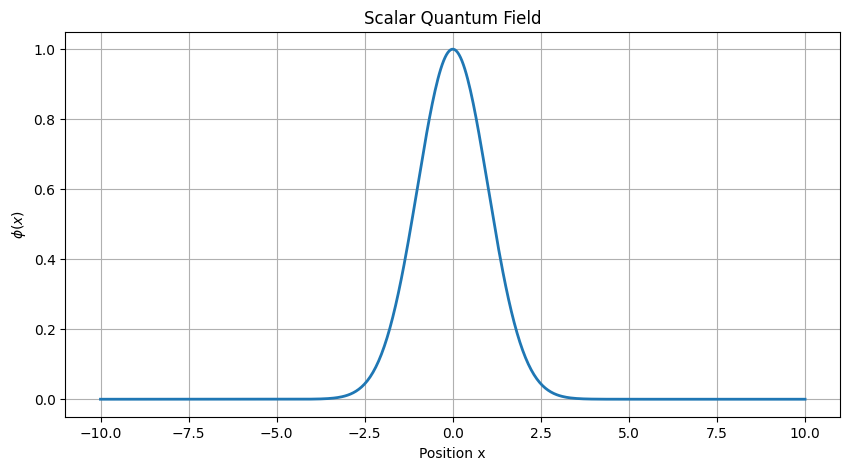

In [4]:
#Classical scalar field
import numpy as np
import matplotlib.pyplot as plt

x = np.linspace(-10, 10, 500)

phi = np.exp(-x**2/2)

plt.figure(figsize=(10, 5))

plt.plot(x, phi, linewidth=2)

plt.xlabel("Position x")
plt.ylabel(r"$\phi(x)$")

plt.title("Scalar Quantum Field")

plt.grid()

plt.show()

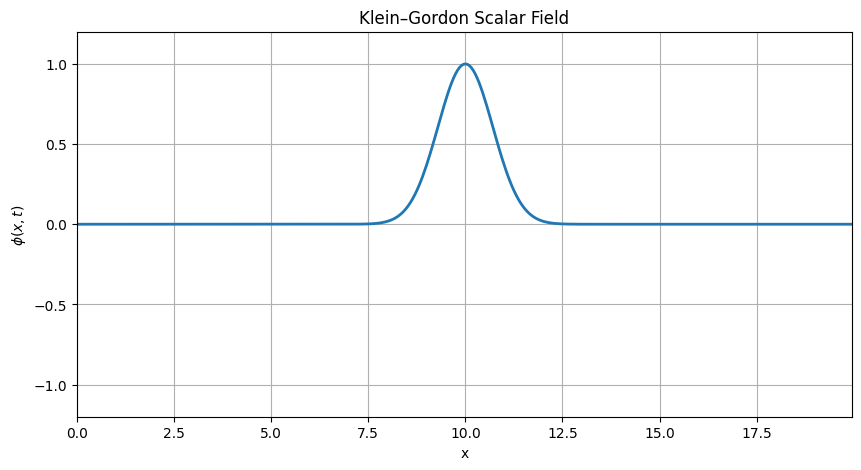

In [5]:
#Klein–Gordon field animation
# ============================================================
# KLEIN-GORDON FIELD
# ============================================================

Nx = 400
dx = 0.05

dt = 0.01

steps = 500

mass = 0.5

x = np.arange(Nx) * dx

# Initial Gaussian field
phi = np.exp(
    -((x - 10)/1.0)**2
)

# Initial time derivative
velocity = np.zeros(Nx)

fig, ax = plt.subplots(figsize=(10, 5))

line, = ax.plot(
    x,
    phi,
    linewidth=2
)

ax.set_xlim(
    x.min(),
    x.max()
)

ax.set_ylim(
    -1.2,
    1.2
)

ax.set_xlabel("x")
ax.set_ylabel(r"$\phi(x,t)$")

ax.set_title(
    "Klein–Gordon Scalar Field"
)

ax.grid()


def update(frame):

    global phi, velocity

    # Second spatial derivative
    laplacian = np.zeros_like(phi)

    laplacian[1:-1] = (
        phi[2:]
        - 2*phi[1:-1]
        + phi[:-2]
    ) / dx**2

    # Klein-Gordon equation
    acceleration = (
        laplacian
        - mass**2 * phi
    )

    velocity += dt * acceleration

    phi += dt * velocity

    # Boundary conditions
    phi[0] = 0
    phi[-1] = 0

    line.set_ydata(phi)

    return line,


ani_KG = FuncAnimation(
    fig,
    update,
    frames=steps,
    interval=20,
    blit=True
)

plt.show()

In [6]:
kg_video = save_animation(
    ani_KG,
    "01_Klein_Gordon_Field",
    fps=30
)

Saved: QFT_Simulations/01_Klein_Gordon_Field.mp4


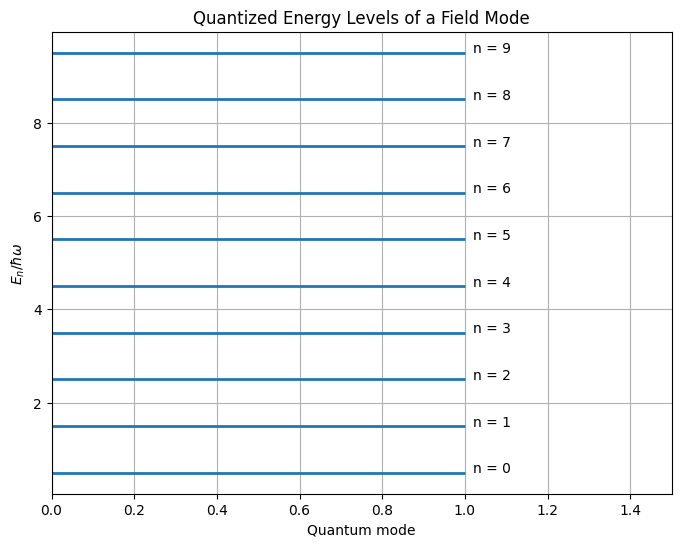

In [7]:
#Quantized harmonic oscillator field modes
# ============================================================
# QUANTIZED FIELD MODE
# ============================================================

hbar = 1
omega = 1

n = np.arange(0, 10)

E = hbar * omega * (n + 0.5)

plt.figure(figsize=(8, 6))

for i, energy in enumerate(E):

    plt.hlines(
        energy,
        0,
        1,
        linewidth=2
    )

    plt.text(
        1.02,
        energy,
        f"n = {i}"
    )

plt.xlabel("Quantum mode")
plt.ylabel(r"$E_n/\hbar\omega$")

plt.title(
    "Quantized Energy Levels of a Field Mode"
)

plt.xlim(0, 1.5)

plt.grid()

plt.show()

In [8]:
#Creation and annihilation operators
# ============================================================
# CREATION AND ANNIHILATION OPERATORS
# ============================================================

N = 10

a = np.zeros((N, N))

for n in range(1, N):

    a[n-1, n] = np.sqrt(n)

adag = a.T

commutator = a @ adag - adag @ a

print("Annihilation operator:")
print(a)

print("\nCreation operator:")
print(adag)

print("\n[a, a†] approximately:")
print(commutator)

Annihilation operator:
[[0.         1.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         1.41421356 0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         1.73205081 0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         2.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.         2.23606798
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  2.44948974 0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         2.64575131 0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         2.82842712 0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         3.        ]
 [0.  

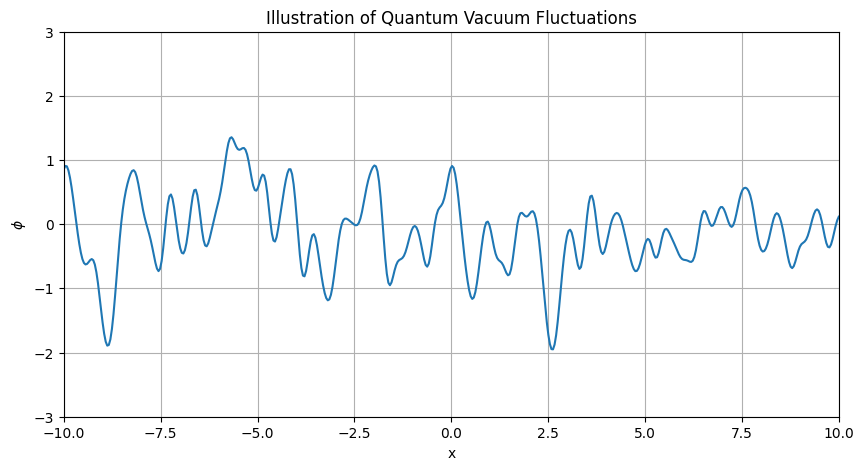

In [9]:
# ============================================================
# VACUUM FLUCTUATIONS
# ============================================================

np.random.seed(10)

x = np.linspace(
    -10,
    10,
    500
)

fig, ax = plt.subplots(
    figsize=(10, 5)
)

line, = ax.plot(
    x,
    np.zeros_like(x)
)

ax.set_xlim(-10, 10)
ax.set_ylim(-3, 3)

ax.set_xlabel("x")
ax.set_ylabel(r"$\phi$")

ax.set_title(
    "Illustration of Quantum Vacuum Fluctuations"
)

ax.grid()


def update(frame):

    noise = np.random.normal(
        0,
        1,
        len(x)
    )

    # Smooth random field
    kernel_x = np.linspace(-3, 3, 31)

    kernel = np.exp(
        -kernel_x**2
    )

    kernel /= kernel.sum()

    fluctuation = np.convolve(
        noise,
        kernel,
        mode="same"
    )

    fluctuation *= 2

    line.set_ydata(
        fluctuation
    )

    return line,


ani_vacuum = FuncAnimation(
    fig,
    update,
    frames=150,
    interval=50,
    blit=True
)

plt.show()

In [10]:
vacuum_video = save_animation(
    ani_vacuum,
    "02_Vacuum_Fluctuations",
    fps=30
)

Saved: QFT_Simulations/02_Vacuum_Fluctuations.mp4


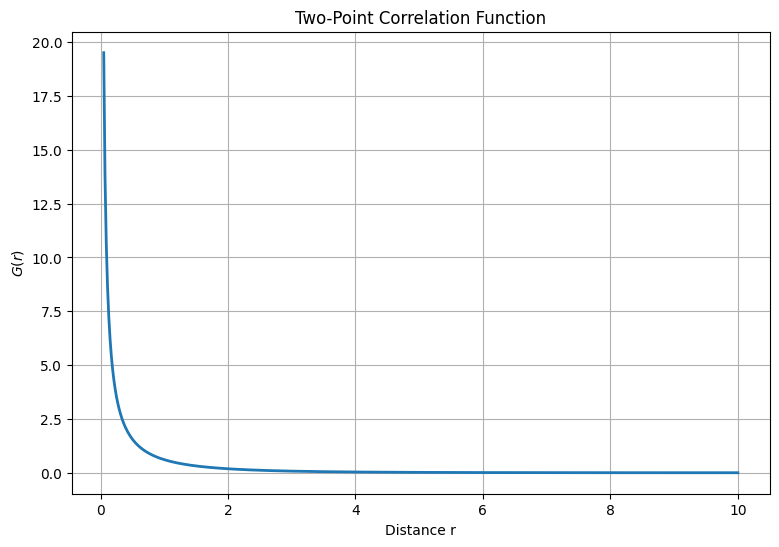

In [11]:
# ============================================================
# TWO-POINT CORRELATION FUNCTION
# ============================================================

r = np.linspace(
    0.05,
    10,
    500
)

m = 0.5

G = np.exp(-m*r) / r

plt.figure(figsize=(9, 6))

plt.plot(
    r,
    G,
    linewidth=2
)

plt.xlabel("Distance r")
plt.ylabel(r"$G(r)$")

plt.title(
    "Two-Point Correlation Function"
)

plt.grid()

plt.show()

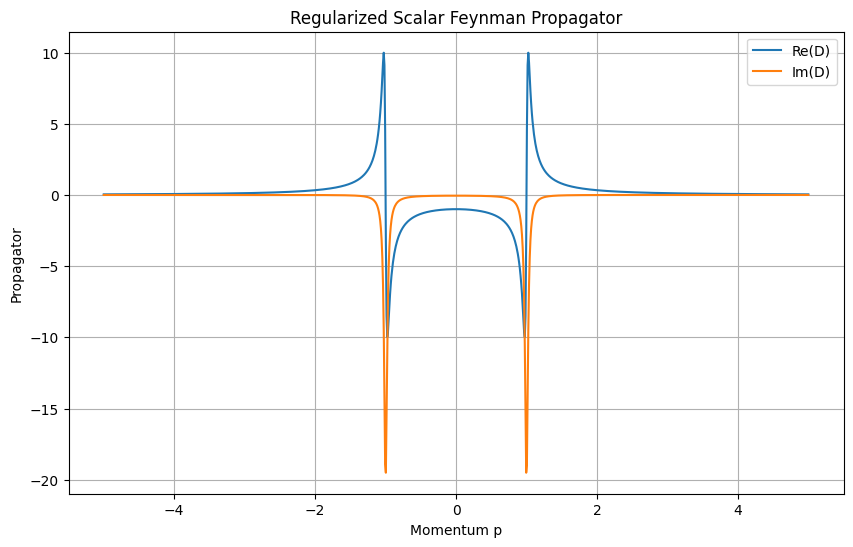

In [12]:
# ============================================================
# FEYNMAN PROPAGATOR
# ============================================================

p = np.linspace(
    -5,
    5,
    1000
)

m = 1.0
epsilon = 0.05

D = 1 / (
    p**2
    - m**2
    + 1j*epsilon
)

plt.figure(figsize=(10, 6))

plt.plot(
    p,
    np.real(D),
    label="Re(D)"
)

plt.plot(
    p,
    np.imag(D),
    label="Im(D)"
)

plt.xlabel("Momentum p")

plt.ylabel("Propagator")

plt.title(
    "Regularized Scalar Feynman Propagator"
)

plt.legend()

plt.grid()

plt.show()

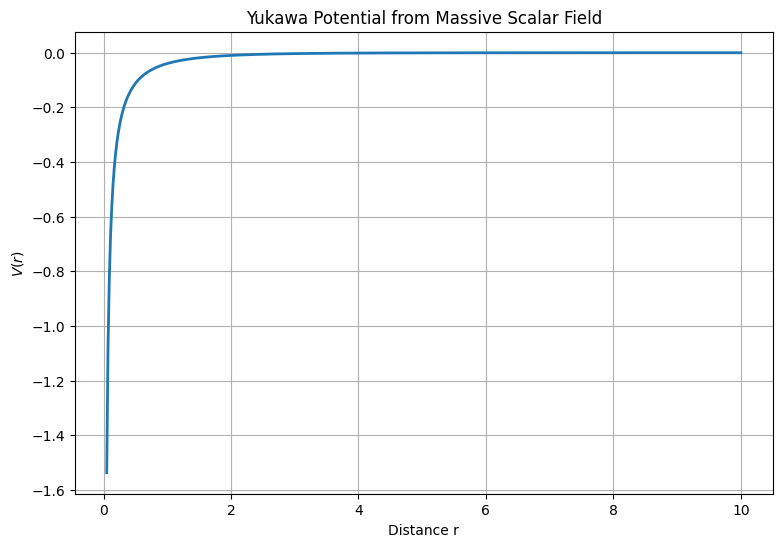

In [13]:
# ============================================================
# YUKAWA POTENTIAL
# ============================================================

r = np.linspace(
    0.05,
    10,
    500
)

g = 1
m = 0.7

V = -g**2/(4*np.pi) * np.exp(-m*r)/r

plt.figure(figsize=(9, 6))

plt.plot(
    r,
    V,
    linewidth=2
)

plt.xlabel("Distance r")
plt.ylabel(r"$V(r)$")

plt.title(
    "Yukawa Potential from Massive Scalar Field"
)

plt.grid()

plt.show()

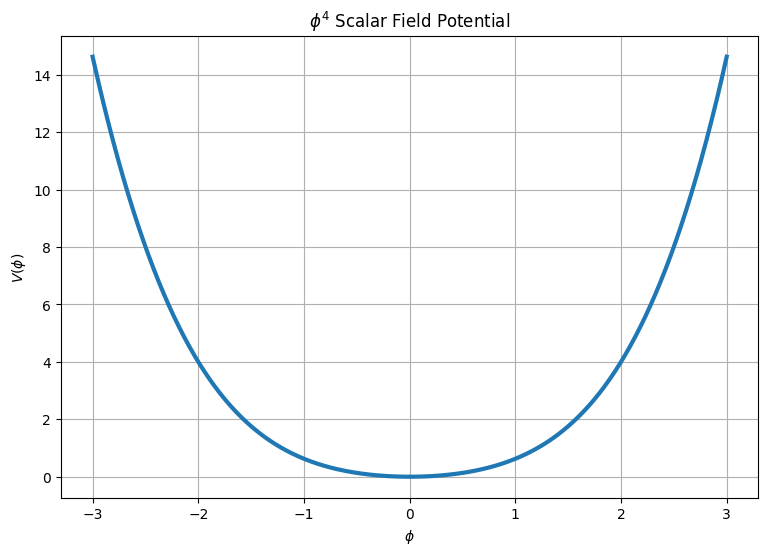

In [14]:
# ============================================================
# PHI^4 FIELD THEORY
# ============================================================

phi = np.linspace(
    -3,
    3,
    500
)

m = 1
lam = 0.5

V = (
    0.5*m**2*phi**2
    +
    lam/4*phi**4
)

plt.figure(figsize=(9, 6))

plt.plot(
    phi,
    V,
    linewidth=3
)

plt.xlabel(r"$\phi$")
plt.ylabel(r"$V(\phi)$")

plt.title(
    r"$\phi^4$ Scalar Field Potential"
)

plt.grid()

plt.show()

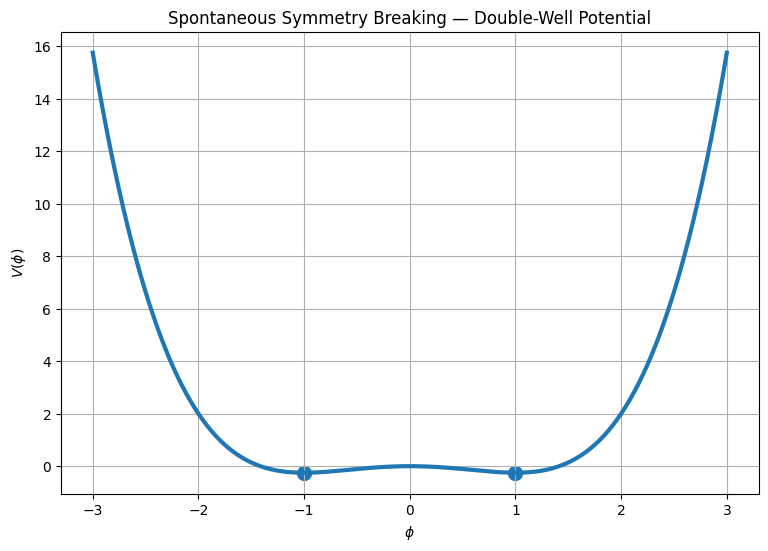

In [15]:
# ============================================================
# SPONTANEOUS SYMMETRY BREAKING
# ============================================================

phi = np.linspace(
    -3,
    3,
    500
)

mu = 1
lam = 1

V = (
    -0.5*mu**2*phi**2
    +
    lam/4*phi**4
)

phi_min = mu/np.sqrt(lam)

plt.figure(figsize=(9, 6))

plt.plot(
    phi,
    V,
    linewidth=3
)

plt.scatter(
    [-phi_min, phi_min],
    [
        -0.5*mu**2*phi_min**2
        + lam/4*phi_min**4,
        -0.5*mu**2*phi_min**2
        + lam/4*phi_min**4
    ],
    s=100
)

plt.xlabel(r"$\phi$")
plt.ylabel(r"$V(\phi)$")

plt.title(
    "Spontaneous Symmetry Breaking — Double-Well Potential"
)

plt.grid()

plt.show()

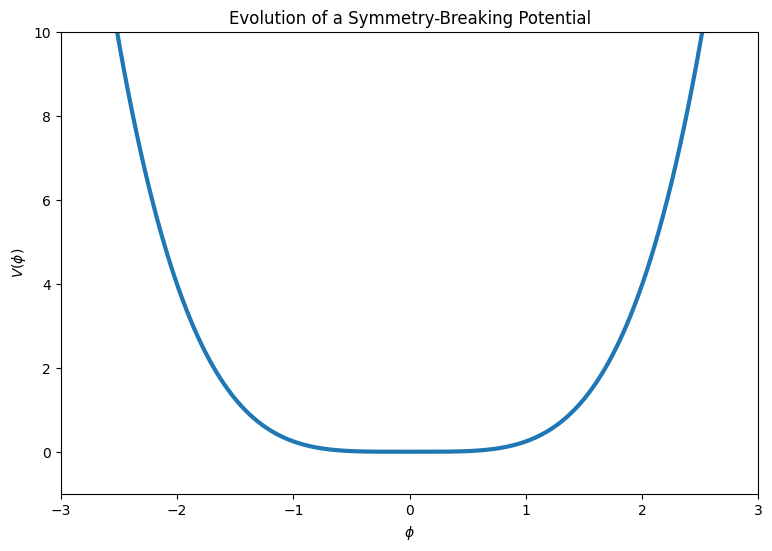

In [16]:
# ============================================================
# ANIMATED DOUBLE-WELL POTENTIAL
# ============================================================

phi = np.linspace(
    -3,
    3,
    500
)

fig, ax = plt.subplots(
    figsize=(9, 6)
)

ax.set_xlim(-3, 3)
ax.set_ylim(-1, 10)

ax.set_xlabel(r"$\phi$")
ax.set_ylabel(r"$V(\phi)$")

ax.set_title(
    "Evolution of a Symmetry-Breaking Potential"
)

line, = ax.plot(
    [],
    [],
    linewidth=3
)

def update(frame):

    mu = 0.1 + frame/100

    lam = 1

    V = (
        -0.5*mu**2*phi**2
        +
        lam/4*phi**4
    )

    line.set_data(
        phi,
        V
    )

    return line,


ani_ssb = FuncAnimation(
    fig,
    update,
    frames=100,
    interval=40,
    blit=True
)

plt.show()

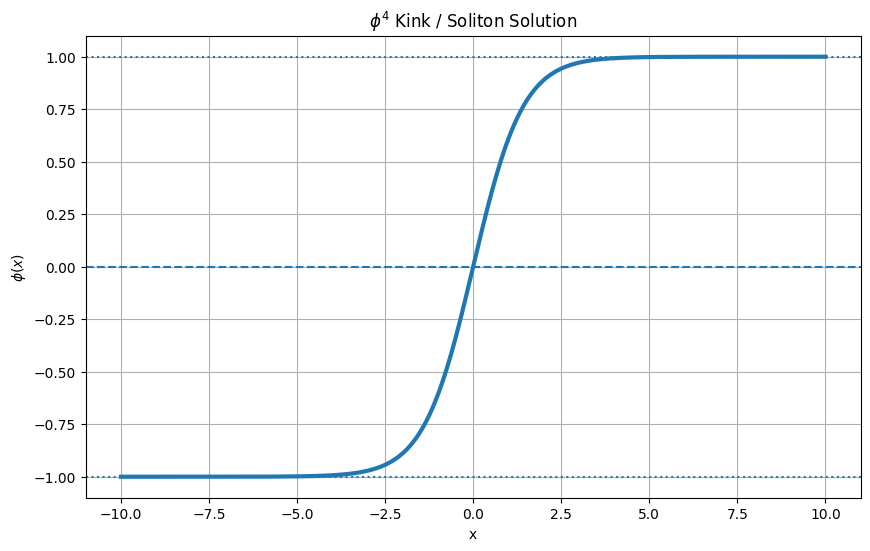

In [17]:
# ============================================================
# PHI^4 KINK / SOLITON
# ============================================================

x = np.linspace(
    -10,
    10,
    500
)

v = 1
m = 1

phi = v*np.tanh(
    m*x/np.sqrt(2)
)

plt.figure(figsize=(10, 6))

plt.plot(
    x,
    phi,
    linewidth=3
)

plt.axhline(
    0,
    linestyle="--"
)

plt.axhline(
    v,
    linestyle=":"
)

plt.axhline(
    -v,
    linestyle=":"
)

plt.xlabel("x")
plt.ylabel(r"$\phi(x)$")

plt.title(
    r"$\phi^4$ Kink / Soliton Solution"
)

plt.grid()

plt.show()

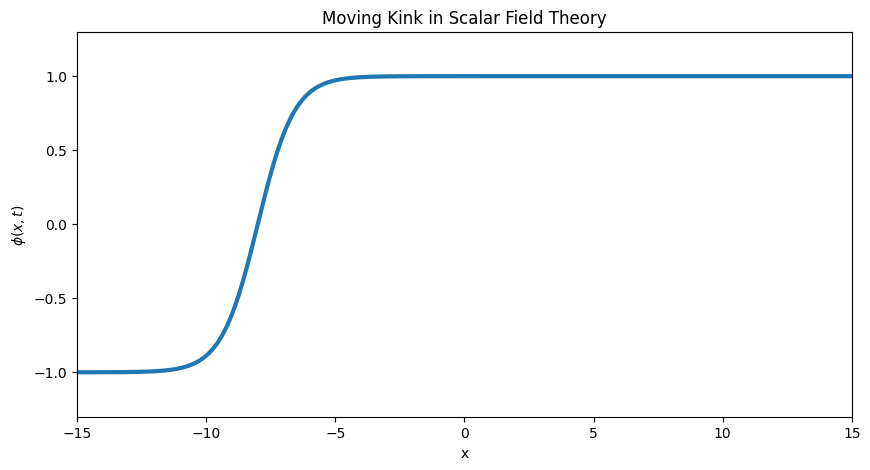

In [18]:
# ============================================================
# MOVING KINK / SOLITON
# ============================================================

x = np.linspace(
    -15,
    15,
    600
)

v = 1
mass = 1

fig, ax = plt.subplots(
    figsize=(10, 5)
)

ax.set_xlim(
    -15,
    15
)

ax.set_ylim(
    -1.3,
    1.3
)

ax.set_xlabel("x")
ax.set_ylabel(r"$\phi(x,t)$")

ax.set_title(
    "Moving Kink in Scalar Field Theory"
)

line, = ax.plot(
    [],
    [],
    linewidth=3
)

def update(frame):

    center = -8 + frame*0.08

    phi = v*np.tanh(
        mass*(x-center)/np.sqrt(2)
    )

    line.set_data(
        x,
        phi
    )

    return line,


ani_kink = FuncAnimation(
    fig,
    update,
    frames=200,
    interval=30,
    blit=True
)

plt.show()

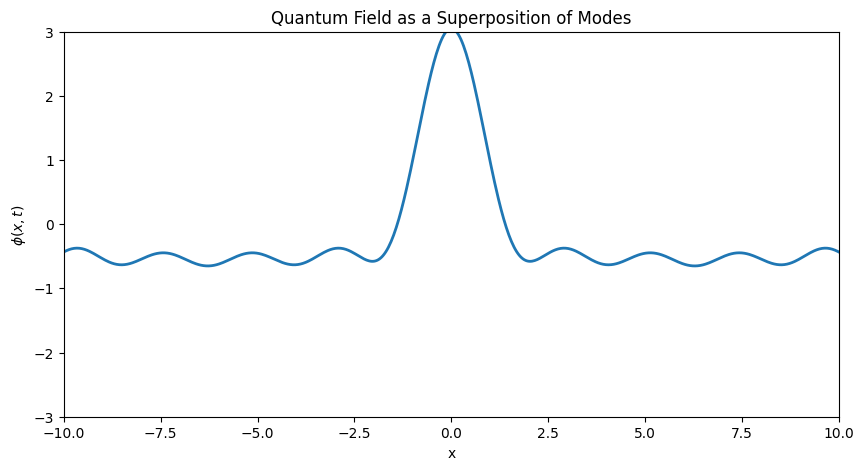

In [19]:
# ============================================================
# QUANTUM FIELD MODE SUPERPOSITION
# ============================================================

x = np.linspace(
    -10,
    10,
    600
)

m = 0.5

k_values = np.array([
    0.5,
    1.0,
    1.5,
    2.0,
    2.5
])

A = np.array([
    1.0,
    0.8,
    0.6,
    0.4,
    0.25
])

omega = np.sqrt(
    k_values**2 + m**2
)

fig, ax = plt.subplots(
    figsize=(10, 5)
)

ax.set_xlim(-10, 10)
ax.set_ylim(-3, 3)

ax.set_xlabel("x")
ax.set_ylabel(r"$\phi(x,t)$")

ax.set_title(
    "Quantum Field as a Superposition of Modes"
)

line, = ax.plot(
    [],
    [],
    linewidth=2
)

def update(frame):

    t = frame*0.04

    field = np.zeros_like(x)

    for ki, Ai, wi in zip(
        k_values,
        A,
        omega
    ):

        field += (
            Ai *
            np.cos(
                ki*x - wi*t
            )
        )

    line.set_data(
        x,
        field
    )

    return line,


ani_modes = FuncAnimation(
    fig,
    update,
    frames=200,
    interval=30,
    blit=True
)

plt.show()

In [20]:
modes_video = save_animation(
    ani_modes,
    "05_Quantum_Field_Mode_Superposition",
    fps=30
)

Saved: QFT_Simulations/05_Quantum_Field_Mode_Superposition.mp4


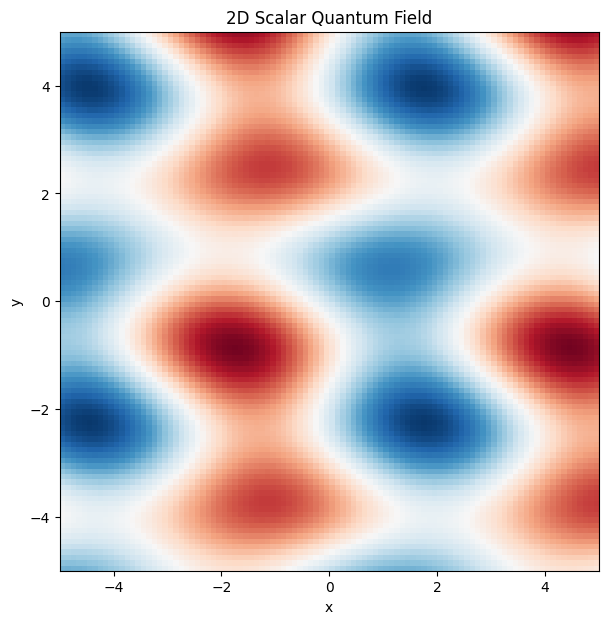

In [21]:
# ============================================================
# 2D SCALAR FIELD
# ============================================================

N = 100

x = np.linspace(
    -5,
    5,
    N
)

y = np.linspace(
    -5,
    5,
    N
)

X, Y = np.meshgrid(
    x,
    y
)

fig, ax = plt.subplots(
    figsize=(8, 7)
)

field = np.zeros(
    (N, N)
)

image = ax.imshow(
    field,
    extent=[
        -5, 5,
        -5, 5
    ],
    origin="lower",
    cmap="RdBu",
    vmin=-1,
    vmax=1
)

ax.set_xlabel("x")
ax.set_ylabel("y")

ax.set_title(
    "2D Scalar Quantum Field"
)

def update(frame):

    t = frame*0.08

    field = (
        0.5*np.sin(
            X + t
        )
        +
        0.3*np.sin(
            2*Y - t
        )
        +
        0.2*np.cos(
            X + Y - 1.5*t
        )
    )

    image.set_data(
        field
    )

    return image,


ani_2d = FuncAnimation(
    fig,
    update,
    frames=200,
    interval=30,
    blit=True
)

plt.show()

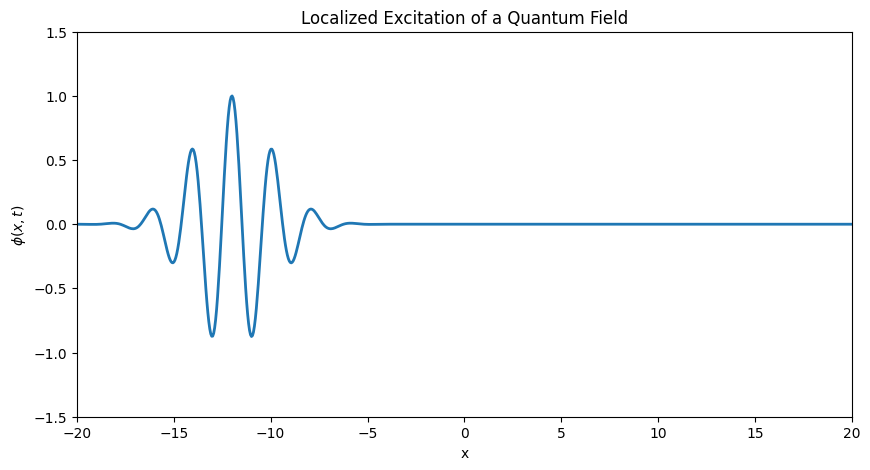

In [22]:
# ============================================================
# FIELD EXCITATION / WAVE PACKET
# ============================================================

x = np.linspace(
    -20,
    20,
    800
)

k0 = 3
sigma = 2

fig, ax = plt.subplots(
    figsize=(10, 5)
)

ax.set_xlim(
    -20,
    20
)

ax.set_ylim(
    -1.5,
    1.5
)

ax.set_xlabel("x")
ax.set_ylabel(r"$\phi(x,t)$")

ax.set_title(
    "Localized Excitation of a Quantum Field"
)

line, = ax.plot(
    [],
    [],
    linewidth=2
)

def update(frame):

    t = frame*0.05

    center = -12 + 0.12*t*20

    envelope = np.exp(
        -(x-center)**2/(2*sigma**2)
    )

    field = envelope*np.cos(
        k0*(x-center)
    )

    line.set_data(
        x,
        field
    )

    return line,


ani_packet = FuncAnimation(
    fig,
    update,
    frames=200,
    interval=30,
    blit=True
)

plt.show()

In [23]:
packet_video = save_animation(
    ani_packet,
    "07_Field_Excitation_Wave_Packet",
    fps=30
)

Saved: QFT_Simulations/07_Field_Excitation_Wave_Packet.mp4


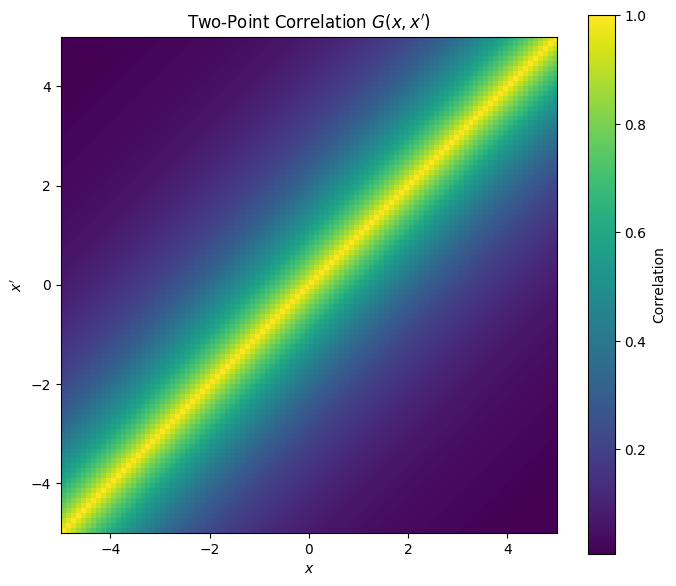

In [24]:
# ============================================================
# VACUUM CORRELATION MATRIX
# ============================================================

N = 100

x = np.linspace(
    -5,
    5,
    N
)

X1, X2 = np.meshgrid(
    x,
    x
)

m = 0.5

distance = np.abs(
    X1-X2
)

correlation = np.exp(
    -m*distance
)

plt.figure(figsize=(8, 7))

plt.imshow(
    correlation,
    extent=[
        -5, 5,
        -5, 5
    ],
    origin="lower",
    cmap="viridis"
)

plt.colorbar(
    label="Correlation"
)

plt.xlabel(r"$x$")
plt.ylabel(r"$x'$")

plt.title(
    r"Two-Point Correlation $G(x,x')$"
)

plt.show()

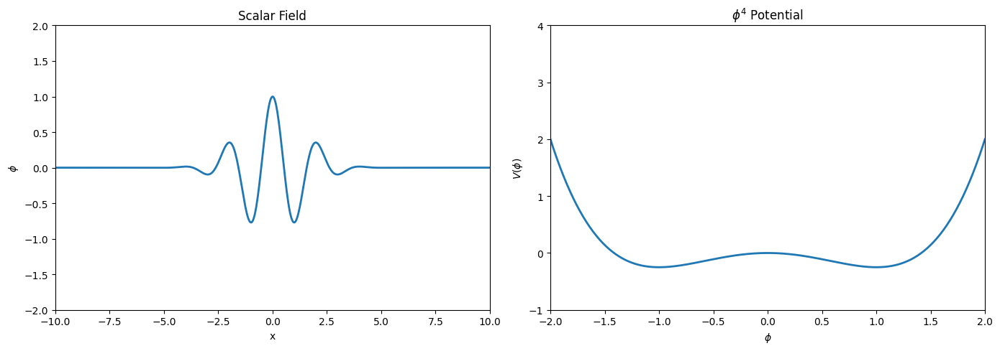

In [25]:
# ============================================================
# COMBINED QFT VISUALIZATION
# ============================================================

x = np.linspace(
    -10,
    10,
    600
)

phi_grid = np.linspace(
    -2,
    2,
    400
)

fig, (ax1, ax2) = plt.subplots(
    1,
    2,
    figsize=(14, 5)
)

# ------------------------------------------------------------
# FIELD
# ------------------------------------------------------------

ax1.set_xlim(
    -10,
    10
)

ax1.set_ylim(
    -2,
    2
)

ax1.set_xlabel("x")
ax1.set_ylabel(r"$\phi$")

ax1.set_title(
    "Scalar Field"
)

field_line, = ax1.plot(
    [],
    [],
    linewidth=2
)

# ------------------------------------------------------------
# POTENTIAL
# ------------------------------------------------------------

ax2.set_xlim(
    -2,
    2
)

ax2.set_ylim(
    -1,
    4
)

ax2.set_xlabel(r"$\phi$")
ax2.set_ylabel(r"$V(\phi)$")

ax2.set_title(
    r"$\phi^4$ Potential"
)

potential_line, = ax2.plot(
    [],
    [],
    linewidth=2
)

def update(frame):

    t = frame*0.05

    field = (
        np.exp(
            -((x-0.5*t)/2)**2
        )
        *
        np.cos(
            3*x - 2*t
        )
    )

    field_line.set_data(
        x,
        field
    )

    mu = 1

    lam = 1

    potential = (
        -0.5*mu**2*phi_grid**2
        +
        lam/4*phi_grid**4
    )

    potential_line.set_data(
        phi_grid,
        potential
    )

    return (
        field_line,
        potential_line
    )


ani_combined = FuncAnimation(
    fig,
    update,
    frames=200,
    interval=30,
    blit=True
)

plt.tight_layout()

plt.show()

In [26]:
combined_video = save_animation(
    ani_combined,
    "08_Combined_QFT_Field_and_Potential",
    fps=30
)

Saved: QFT_Simulations/08_Combined_QFT_Field_and_Potential.mp4


In [27]:
print("\nGenerated QFT files:\n")

for file in sorted(
    OUTPUT_DIR.iterdir()
):

    print(file.name)


Generated QFT files:

01_Klein_Gordon_Field.mp4
02_Vacuum_Fluctuations.mp4
05_Quantum_Field_Mode_Superposition.mp4
07_Field_Excitation_Wave_Packet.mp4
08_Combined_QFT_Field_and_Potential.mp4


Simulation Video of Quantum Field Theory

In [28]:
!apt-get -qq update
!apt-get -qq install ffmpeg
!pip -q install numpy matplotlib pillow scipy

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)


In [29]:
# ============================================================
# QUANTUM FIELD THEORY (QFT)
# COMPLETE SIMULATION + ANIMATION VIDEO PACKAGE
#
# Suitable for:
# Google Colab / Jupyter Notebook
#
# Videos:
# 1. Klein-Gordon Field
# 2. Vacuum Fluctuations
# 3. Spontaneous Symmetry Breaking
# 4. Moving Phi^4 Kink
# 5. Quantum Field Mode Superposition
# 6. 2D Scalar Quantum Field
# 7. Localized Field Excitation
# 8. Combined QFT Field + Potential
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

from matplotlib.animation import (
    FuncAnimation,
    FFMpegWriter,
    PillowWriter
)

from IPython.display import Video, display

from pathlib import Path
import shutil
import os


# ============================================================
# OUTPUT DIRECTORY
# ============================================================

OUTPUT_DIR = Path("QFT_Animation_Videos")
OUTPUT_DIR.mkdir(exist_ok=True)

print("Videos will be saved in:")
print(OUTPUT_DIR.resolve())


# ============================================================
# VIDEO SAVING FUNCTION
# ============================================================

def save_video(animation, filename, fps=30, dpi=120):

    mp4_path = OUTPUT_DIR / f"{filename}.mp4"

    writer = FFMpegWriter(
        fps=fps,
        metadata={
            "title": filename,
            "artist": "B.Sc. CSIT Physics - QFT Simulation"
        },
        bitrate=2500
    )

    print("\nCreating:", mp4_path)

    animation.save(
        mp4_path,
        writer=writer,
        dpi=dpi
    )

    print("Saved successfully.")

    return mp4_path


# ============================================================
# DISPLAY VIDEO
# ============================================================

def show_video(video_path):

    display(
        Video(
            str(video_path),
            embed=True,
            width=800
        )
    )

Videos will be saved in:
/content/QFT_Animation_Videos


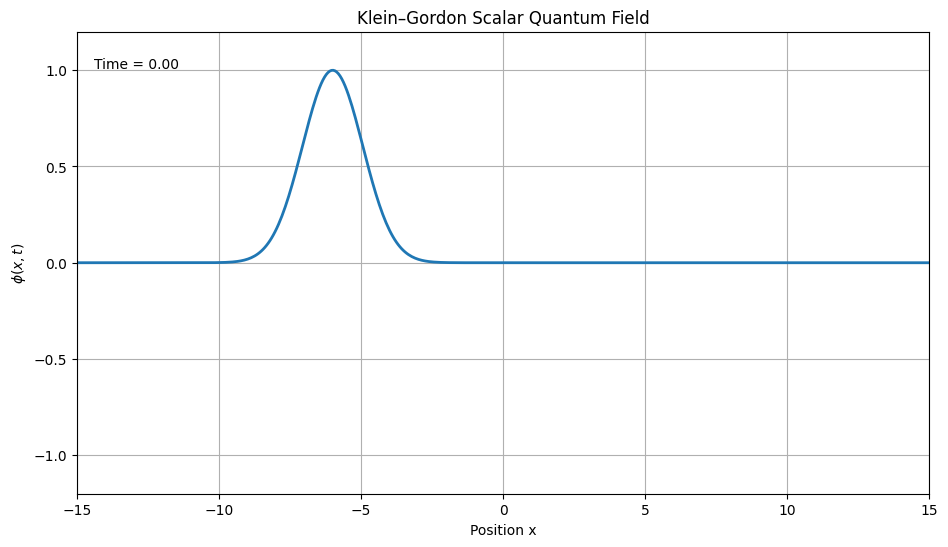

In [30]:
# ============================================================
# VIDEO 1
# KLEIN-GORDON FIELD
# ============================================================

Nx = 500

x_min = -15
x_max = 15

x = np.linspace(
    x_min,
    x_max,
    Nx
)

dx = x[1] - x[0]

dt = 0.005

mass = 0.5

frames = 300


# ------------------------------------------------------------
# Initial field
# ------------------------------------------------------------

phi = np.exp(
    -((x + 6)/1.5)**2
)

velocity = np.zeros_like(phi)


# ------------------------------------------------------------
# Figure
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(11, 6)
)

line, = ax.plot(
    x,
    phi,
    linewidth=2
)

ax.set_xlim(
    x_min,
    x_max
)

ax.set_ylim(
    -1.2,
    1.2
)

ax.set_xlabel("Position x")

ax.set_ylabel(
    r"$\phi(x,t)$"
)

ax.set_title(
    "Klein–Gordon Scalar Quantum Field"
)

ax.grid()

time_text = ax.text(
    0.02,
    0.92,
    "",
    transform=ax.transAxes
)


# ------------------------------------------------------------
# Animation
# ------------------------------------------------------------

def update(frame):

    global phi
    global velocity

    laplacian = np.zeros_like(phi)

    laplacian[1:-1] = (
        phi[2:]
        - 2*phi[1:-1]
        + phi[:-2]
    ) / dx**2

    acceleration = (
        laplacian
        - mass**2 * phi
    )

    velocity += dt * acceleration

    phi += dt * velocity

    # Boundary conditions
    phi[0] = 0
    phi[-1] = 0

    line.set_ydata(phi)

    time_text.set_text(
        f"Time = {frame*dt:.2f}"
    )

    return line, time_text


ani1 = FuncAnimation(
    fig,
    update,
    frames=frames,
    interval=30,
    blit=True
)

plt.show()

In [31]:
video1 = save_video(
    ani1,
    "01_Klein_Gordon_Field"
)


Creating: QFT_Animation_Videos/01_Klein_Gordon_Field.mp4
Saved successfully.


In [32]:
show_video(video1)

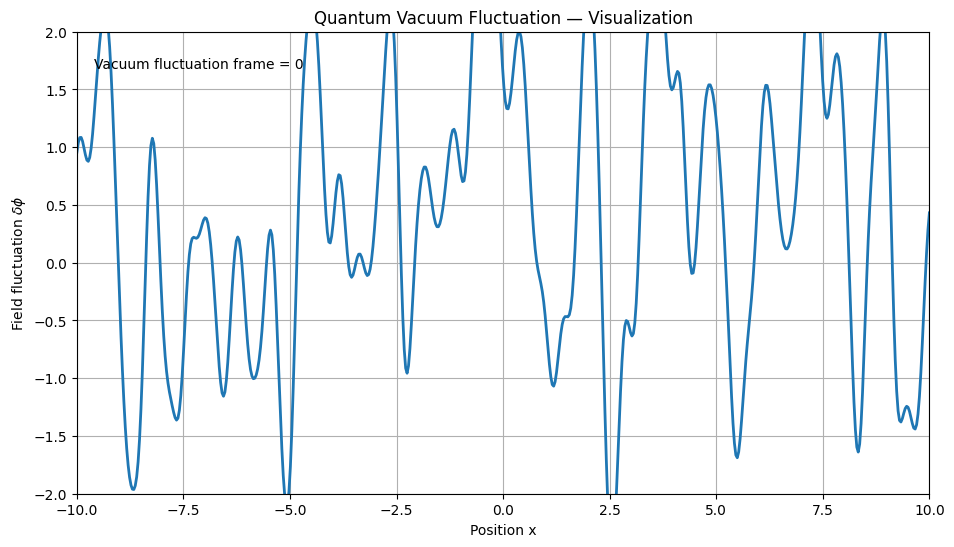

In [33]:
# ============================================================
# VIDEO 2
# QUANTUM VACUUM FLUCTUATIONS
# ============================================================

np.random.seed(42)

x = np.linspace(
    -10,
    10,
    600
)

fig, ax = plt.subplots(
    figsize=(11, 6)
)

line, = ax.plot(
    x,
    np.zeros_like(x),
    linewidth=2
)

ax.set_xlim(
    -10,
    10
)

ax.set_ylim(
    -2,
    2
)

ax.set_xlabel("Position x")

ax.set_ylabel(
    r"Field fluctuation $\delta\phi$"
)

ax.set_title(
    "Quantum Vacuum Fluctuation — Visualization"
)

ax.grid()

time_text = ax.text(
    0.02,
    0.92,
    "",
    transform=ax.transAxes
)


def update(frame):

    noise = np.random.normal(
        0,
        1,
        len(x)
    )

    kernel_x = np.linspace(
        -3,
        3,
        41
    )

    kernel = np.exp(
        -kernel_x**2
    )

    kernel /= kernel.sum()

    fluctuation = np.convolve(
        noise,
        kernel,
        mode="same"
    )

    fluctuation *= 5

    line.set_ydata(
        fluctuation
    )

    time_text.set_text(
        f"Vacuum fluctuation frame = {frame}"
    )

    return line, time_text


ani2 = FuncAnimation(
    fig,
    update,
    frames=250,
    interval=30,
    blit=True
)

plt.show()

In [34]:
video2 = save_video(
    ani2,
    "02_Quantum_Vacuum_Fluctuations"
)

show_video(video2)


Creating: QFT_Animation_Videos/02_Quantum_Vacuum_Fluctuations.mp4
Saved successfully.


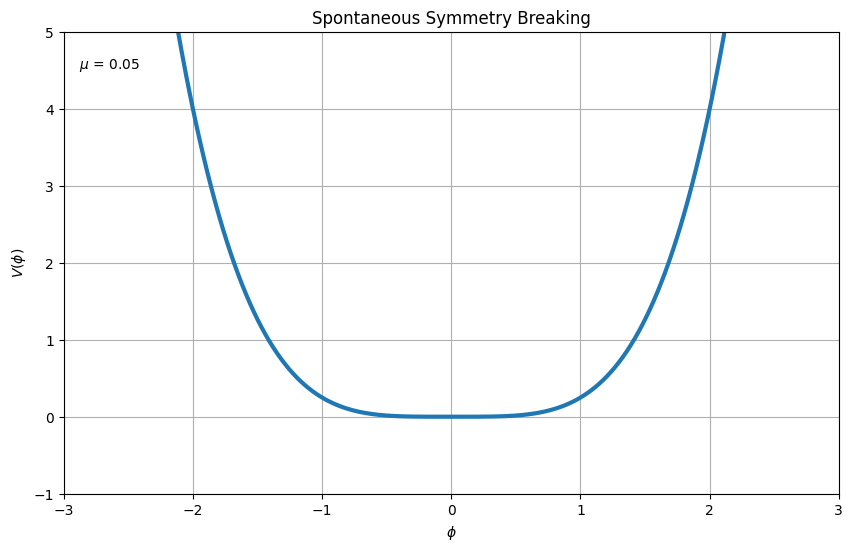

In [35]:
# ============================================================
# VIDEO 3
# SPONTANEOUS SYMMETRY BREAKING
# ============================================================

phi = np.linspace(
    -3,
    3,
    600
)

fig, ax = plt.subplots(
    figsize=(10, 6)
)

line, = ax.plot(
    [],
    [],
    linewidth=3
)

ax.set_xlim(
    -3,
    3
)

ax.set_ylim(
    -1,
    5
)

ax.set_xlabel(
    r"$\phi$"
)

ax.set_ylabel(
    r"$V(\phi)$"
)

ax.set_title(
    "Spontaneous Symmetry Breaking"
)

ax.grid()

time_text = ax.text(
    0.02,
    0.92,
    "",
    transform=ax.transAxes
)


def update(frame):

    mu = 0.05 + frame*0.015

    lam = 1.0

    V = (
        -0.5 * mu**2 * phi**2
        +
        lam/4 * phi**4
    )

    line.set_data(
        phi,
        V
    )

    time_text.set_text(
        f"$\\mu$ = {mu:.2f}"
    )

    return line, time_text


ani3 = FuncAnimation(
    fig,
    update,
    frames=100,
    interval=50,
    blit=True
)

plt.show()

In [36]:
video3 = save_video(
    ani3,
    "03_Spontaneous_Symmetry_Breaking"
)

show_video(video3)


Creating: QFT_Animation_Videos/03_Spontaneous_Symmetry_Breaking.mp4
Saved successfully.


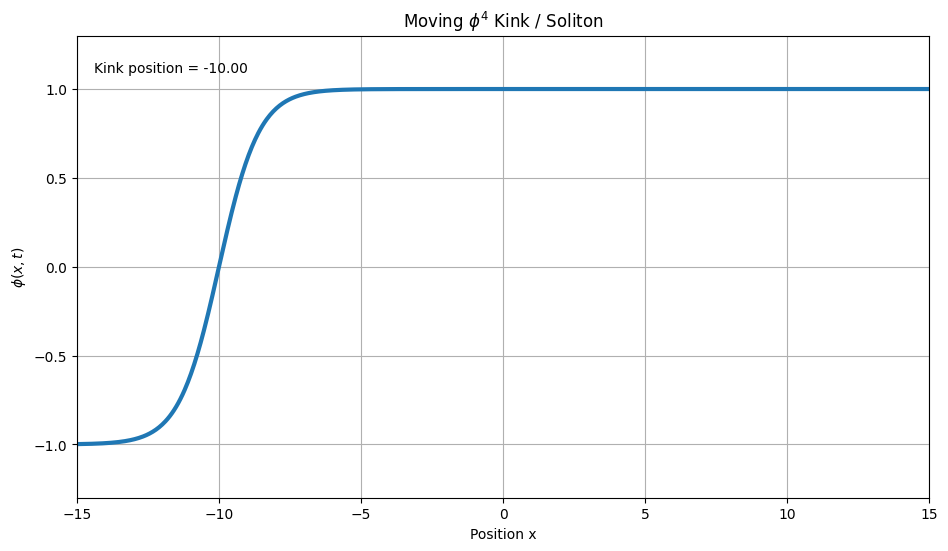

In [37]:
# ============================================================
# VIDEO 4
# MOVING PHI^4 KINK
# ============================================================

x = np.linspace(
    -15,
    15,
    800
)

v = 1.0
m = 1.0

fig, ax = plt.subplots(
    figsize=(11, 6)
)

line, = ax.plot(
    [],
    [],
    linewidth=3
)

ax.set_xlim(
    -15,
    15
)

ax.set_ylim(
    -1.3,
    1.3
)

ax.set_xlabel("Position x")

ax.set_ylabel(
    r"$\phi(x,t)$"
)

ax.set_title(
    r"Moving $\phi^4$ Kink / Soliton"
)

ax.grid()

position_text = ax.text(
    0.02,
    0.92,
    "",
    transform=ax.transAxes
)


def update(frame):

    x0 = -10 + frame*0.08

    phi = v*np.tanh(
        m*(x-x0)/np.sqrt(2)
    )

    line.set_data(
        x,
        phi
    )

    position_text.set_text(
        f"Kink position = {x0:.2f}"
    )

    return line, position_text


ani4 = FuncAnimation(
    fig,
    update,
    frames=250,
    interval=30,
    blit=True
)

plt.show()

In [38]:
video4 = save_video(
    ani4,
    "04_Moving_Phi4_Kink"
)

show_video(video4)


Creating: QFT_Animation_Videos/04_Moving_Phi4_Kink.mp4
Saved successfully.


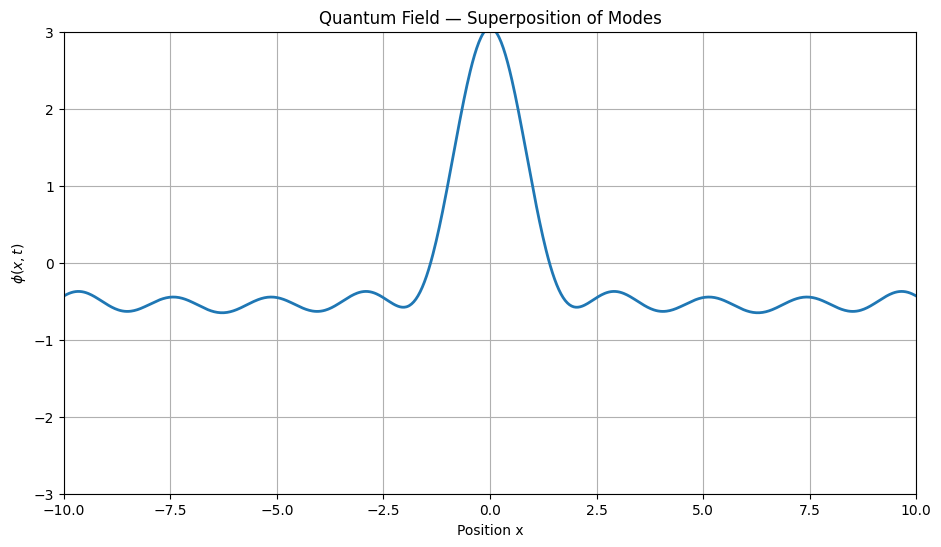

In [39]:
# ============================================================
# VIDEO 5
# QUANTUM FIELD MODE SUPERPOSITION
# ============================================================

x = np.linspace(
    -10,
    10,
    800
)

mass = 0.5

k_values = np.array([
    0.5,
    1.0,
    1.5,
    2.0,
    2.5
])

amplitudes = np.array([
    1.0,
    0.8,
    0.6,
    0.4,
    0.25
])

omega_values = np.sqrt(
    k_values**2 + mass**2
)

fig, ax = plt.subplots(
    figsize=(11, 6)
)

line, = ax.plot(
    [],
    [],
    linewidth=2
)

ax.set_xlim(
    -10,
    10
)

ax.set_ylim(
    -3,
    3
)

ax.set_xlabel("Position x")

ax.set_ylabel(
    r"$\phi(x,t)$"
)

ax.set_title(
    "Quantum Field — Superposition of Modes"
)

ax.grid()


def update(frame):

    t = frame*0.04

    field = np.zeros_like(x)

    for k, A, omega in zip(
        k_values,
        amplitudes,
        omega_values
    ):

        field += (
            A *
            np.cos(
                k*x - omega*t
            )
        )

    line.set_data(
        x,
        field
    )

    return line,


ani5 = FuncAnimation(
    fig,
    update,
    frames=250,
    interval=30,
    blit=True
)

plt.show()

In [40]:
video5 = save_video(
    ani5,
    "05_Quantum_Field_Mode_Superposition"
)

show_video(video5)


Creating: QFT_Animation_Videos/05_Quantum_Field_Mode_Superposition.mp4
Saved successfully.


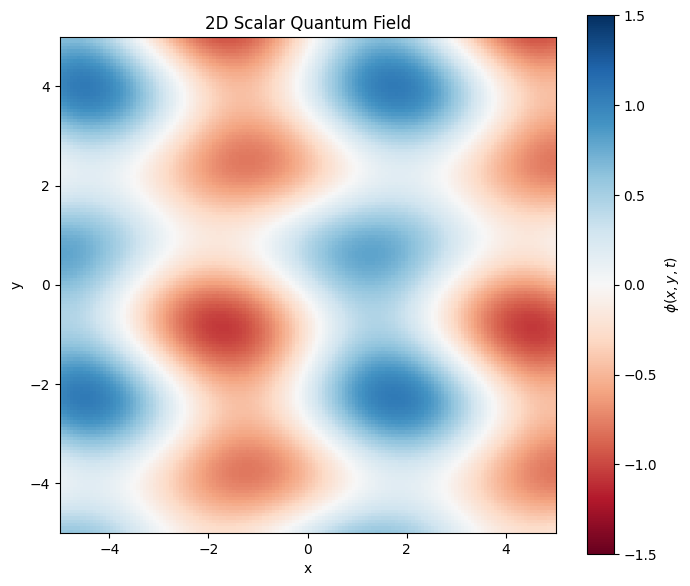

In [41]:
# ============================================================
# VIDEO 6
# 2D SCALAR QUANTUM FIELD
# ============================================================

N = 150

x = np.linspace(
    -5,
    5,
    N
)

y = np.linspace(
    -5,
    5,
    N
)

X, Y = np.meshgrid(
    x,
    y
)

fig, ax = plt.subplots(
    figsize=(8, 7)
)

field = np.zeros(
    (N, N)
)

image = ax.imshow(
    field,
    extent=[
        -5,
        5,
        -5,
        5
    ],
    origin="lower",
    cmap="RdBu",
    vmin=-1.5,
    vmax=1.5
)

plt.colorbar(
    image,
    ax=ax,
    label=r"$\phi(x,y,t)$"
)

ax.set_xlabel("x")
ax.set_ylabel("y")

ax.set_title(
    "2D Scalar Quantum Field"
)


def update(frame):

    t = frame*0.06

    field = (
        0.6*np.sin(
            X + t
        )
        +
        0.3*np.sin(
            2*Y - 1.3*t
        )
        +
        0.2*np.cos(
            X + Y - 2*t
        )
    )

    image.set_data(
        field
    )

    return image,


ani6 = FuncAnimation(
    fig,
    update,
    frames=250,
    interval=30,
    blit=True
)

plt.show()

In [42]:
video6 = save_video(
    ani6,
    "06_2D_Scalar_Quantum_Field"
)

show_video(video6)


Creating: QFT_Animation_Videos/06_2D_Scalar_Quantum_Field.mp4
Saved successfully.


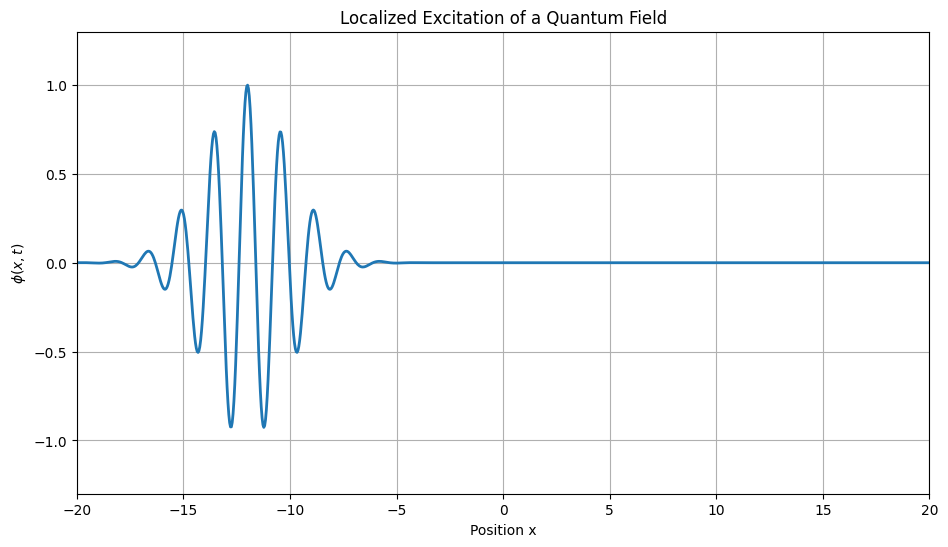

In [43]:
# ============================================================
# VIDEO 7
# LOCALIZED FIELD EXCITATION
# ============================================================

x = np.linspace(
    -20,
    20,
    1000
)

k0 = 4.0
sigma = 2.0

fig, ax = plt.subplots(
    figsize=(11, 6)
)

line, = ax.plot(
    [],
    [],
    linewidth=2
)

ax.set_xlim(
    -20,
    20
)

ax.set_ylim(
    -1.3,
    1.3
)

ax.set_xlabel("Position x")

ax.set_ylabel(
    r"$\phi(x,t)$"
)

ax.set_title(
    "Localized Excitation of a Quantum Field"
)

ax.grid()


def update(frame):

    t = frame*0.05

    center = -12 + 0.12*frame

    envelope = np.exp(
        -(x-center)**2 /
        (2*sigma**2)
    )

    field = (
        envelope *
        np.cos(
            k0*(x-center)
        )
    )

    line.set_data(
        x,
        field
    )

    return line,


ani7 = FuncAnimation(
    fig,
    update,
    frames=200,
    interval=30,
    blit=True
)

plt.show()

In [44]:
video7 = save_video(
    ani7,
    "07_Localized_Field_Excitation"
)

show_video(video7)


Creating: QFT_Animation_Videos/07_Localized_Field_Excitation.mp4
Saved successfully.


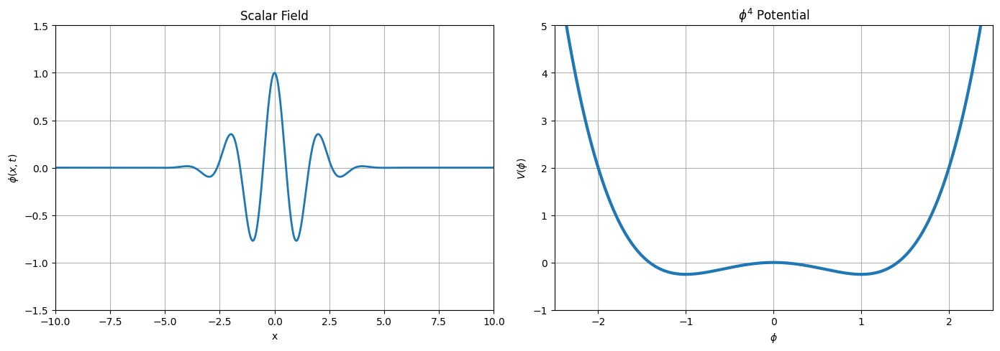

In [45]:
# ============================================================
# VIDEO 8
# COMBINED QFT FIELD + POTENTIAL
# ============================================================

x = np.linspace(
    -10,
    10,
    700
)

phi = np.linspace(
    -2.5,
    2.5,
    500
)

fig, (ax1, ax2) = plt.subplots(
    1,
    2,
    figsize=(14, 5)
)


# ------------------------------------------------------------
# LEFT: FIELD
# ------------------------------------------------------------

ax1.set_xlim(
    -10,
    10
)

ax1.set_ylim(
    -1.5,
    1.5
)

ax1.set_xlabel("x")

ax1.set_ylabel(
    r"$\phi(x,t)$"
)

ax1.set_title(
    "Scalar Field"
)

field_line, = ax1.plot(
    [],
    [],
    linewidth=2
)

ax1.grid()


# ------------------------------------------------------------
# RIGHT: POTENTIAL
# ------------------------------------------------------------

ax2.set_xlim(
    -2.5,
    2.5
)

ax2.set_ylim(
    -1,
    5
)

ax2.set_xlabel(
    r"$\phi$"
)

ax2.set_ylabel(
    r"$V(\phi)$"
)

ax2.set_title(
    r"$\phi^4$ Potential"
)

potential_line, = ax2.plot(
    [],
    [],
    linewidth=3
)

ax2.grid()


# ------------------------------------------------------------
# ANIMATION
# ------------------------------------------------------------

def update(frame):

    t = frame*0.05

    # Field excitation
    field = (
        np.exp(
            -((x - 0.4*t)/2)**2
        )
        *
        np.cos(
            3*x - 2*t
        )
    )

    field_line.set_data(
        x,
        field
    )


    # Double-well potential
    mu = 1.0
    lam = 1.0

    V = (
        -0.5*mu**2*phi**2
        +
        lam/4*phi**4
    )

    potential_line.set_data(
        phi,
        V
    )

    return (
        field_line,
        potential_line
    )


ani8 = FuncAnimation(
    fig,
    update,
    frames=250,
    interval=30,
    blit=True
)

plt.tight_layout()

plt.show()

In [46]:
video8 = save_video(
    ani8,
    "08_Combined_QFT_Field_and_Potential"
)

show_video(video8)


Creating: QFT_Animation_Videos/08_Combined_QFT_Field_and_Potential.mp4
Saved successfully.


In [47]:
# ============================================================
# CREATE ZIP FILE
# ============================================================

zip_path = shutil.make_archive(
    "QFT_Simulation_Video_Package",
    "zip",
    OUTPUT_DIR
)

print("ZIP file:")
print(zip_path)

ZIP file:
/content/QFT_Simulation_Video_Package.zip


In [48]:
# ============================================================
# COLORFUL QUANTUM FIELD THEORY (QFT)
# ANIMATED SVG SIMULATION PACKAGE
#
# Google Colab / Jupyter Notebook
# No FFmpeg required
# ============================================================

from pathlib import Path
import zipfile
import math

# ------------------------------------------------------------
# Output folder
# ------------------------------------------------------------

OUTPUT_DIR = Path("QFT_Colorful_SVG")
OUTPUT_DIR.mkdir(exist_ok=True)

print("Output folder:")
print(OUTPUT_DIR.resolve())


# ============================================================
# SVG HEADER
# ============================================================

def svg_header(title, width=700, height=400, background="#050816"):

    return f'''<?xml version="1.0" encoding="UTF-8"?>

<svg xmlns="http://www.w3.org/2000/svg"
     width="{width}"
     height="{height}"
     viewBox="0 0 {width} {height}">

<rect width="100%"
      height="100%"
      fill="{background}"/>

<text x="{width/2}"
      y="32"
      text-anchor="middle"
      fill="white"
      font-family="Arial"
      font-size="20"
      font-weight="bold">

{title}

</text>
'''


# ============================================================
# SAVE SVG
# ============================================================

def save_svg(filename, title, body):

    svg = (
        svg_header(title)
        +
        body
        +
        "\n</svg>"
    )

    path = OUTPUT_DIR / filename

    path.write_text(
        svg,
        encoding="utf-8"
    )

    print("Created:", path)

    return path


# ============================================================
# 1. KLEIN-GORDON FIELD
# ============================================================

body = r'''
<defs>

<linearGradient id="kgGradient"
                x1="0"
                x2="1">

<stop offset="0"
      stop-color="#00e5ff"/>

<stop offset="0.5"
      stop-color="#7c4dff"/>

<stop offset="1"
      stop-color="#ff2bd6"/>

</linearGradient>

<filter id="glow">

<feGaussianBlur
    stdDeviation="3"
    result="blur"/>

<feMerge>

<feMergeNode in="blur"/>

<feMergeNode in="SourceGraphic"/>

</feMerge>

</filter>

</defs>


<!-- Axis -->

<line x1="50"
      y1="200"
      x2="650"
      y2="200"
      stroke="#777"/>


<!-- Field -->

<path
d="M50 200
Q100 200 130 140
Q160 80 190 200
Q220 320 250 200
Q280 80 310 200
Q340 320 370 200
Q400 80 430 200
Q460 320 490 200
Q520 100 550 200
Q580 280 650 200"

fill="none"

stroke="url(#kgGradient)"

stroke-width="4"

filter="url(#glow)">

<animateTransform

attributeName="transform"

type="translate"

from="-100 0"

to="100 0"

dur="5s"

repeatCount="indefinite"/>

</path>


<text x="350"
      y="375"
      text-anchor="middle"
      fill="#bdefff"
      font-family="Arial"
      font-size="16">

Klein–Gordon scalar field φ(x,t)

</text>

'''

save_svg(
    "01_Klein_Gordon_Field.svg",
    "Klein–Gordon Scalar Field",
    body
)


# ============================================================
# 2. QUANTUM VACUUM FLUCTUATIONS
# ============================================================

body = r'''
<defs>

<filter id="vacuumGlow">

<feGaussianBlur
stdDeviation="3"
result="blur"/>

<feMerge>

<feMergeNode in="blur"/>

<feMergeNode in="SourceGraphic"/>

</feMerge>

</filter>

</defs>


<line x1="50"
      y1="200"
      x2="650"
      y2="200"
      stroke="#555"/>


<path

d="M50 200
C100 120 130 290 170 190
S240 100 280 210
S350 310 390 180
S460 100 500 210
S570 300 650 170"

fill="none"

stroke="#00f5ff"

stroke-width="4"

filter="url(#vacuumGlow)">


<animate

attributeName="d"

dur="1.8s"

repeatCount="indefinite"

values="

M50 200
C100 120 130 290 170 190
S240 100 280 210
S350 310 390 180
S460 100 500 210
S570 300 650 170;

M50 210
C110 300 140 100 180 210
S250 310 300 180
S360 90 410 220
S480 300 530 180
S600 90 650 210;

M50 200
C100 120 130 290 170 190
S240 100 280 210
S350 310 390 180
S460 100 500 210
S570 300 650 170

"/>

</path>


<text x="350"
      y="375"
      text-anchor="middle"
      fill="#bdefff"
      font-family="Arial">

Vacuum fluctuations — illustrative visualization

</text>

'''

save_svg(
    "02_Vacuum_Fluctuations.svg",
    "Quantum Vacuum Fluctuations",
    body
)


# ============================================================
# 3. SPONTANEOUS SYMMETRY BREAKING
# ============================================================

body = r'''
<path

d="M80 300
C150 300 180 130 260 130
C350 130 350 300 440 300
C520 300 540 130 620 130"

fill="none"

stroke="#ffb000"

stroke-width="5"/>


<!-- Left vacuum -->

<circle
cx="190"
cy="250"
r="10"
fill="#00e5ff">

<animate

attributeName="cx"

values="350;190;350"

dur="5s"

repeatCount="indefinite"/>

</circle>


<!-- Right vacuum -->

<circle
cx="510"
cy="250"
r="10"
fill="#ff2bd6">

<animate

attributeName="cx"

values="350;510;350"

dur="5s"

repeatCount="indefinite"/>

</circle>


<text x="350"
      y="375"
      text-anchor="middle"
      fill="#bdefff"
      font-family="Arial">

V(φ) = −μ²φ²/2 + λφ⁴/4

</text>

'''

save_svg(
    "03_Symmetry_Breaking.svg",
    "Spontaneous Symmetry Breaking",
    body
)


# ============================================================
# 4. MOVING PHI^4 KINK
# ============================================================

body = r'''
<defs>

<linearGradient id="kinkGradient"
                x1="0"
                x2="1">

<stop stop-color="#00e5ff"/>

<stop offset="0.5"
      stop-color="#00ff85"/>

<stop offset="1"
      stop-color="#ffe600"/>

</linearGradient>

</defs>


<path

d="M50 300
C150 300 210 300 280 300
C330 300 330 100 380 100
C430 100 430 300 480 300
C550 300 600 300 650 300"

fill="none"

stroke="url(#kinkGradient)"

stroke-width="7">


<animateTransform

attributeName="transform"

type="translate"

from="-170 0"

to="170 0"

dur="6s"

repeatCount="indefinite"/>

</path>


<text x="350"
      y="375"
      text-anchor="middle"
      fill="#bdefff"
      font-family="Arial">

φ⁴ kink / soliton

</text>

'''

save_svg(
    "04_Phi4_Kink.svg",
    "Moving φ⁴ Kink / Soliton",
    body
)


# ============================================================
# 5. QUANTUM FIELD MODE SUPERPOSITION
# ============================================================

colors = [
    "#00e5ff",
    "#7c4dff",
    "#ff2bd6",
    "#00ff85",
    "#ffe600"
]

body = ""

for j, color in enumerate(colors):

    y = 120 + j * 40

    body += f'''

<path

d="M50 {y}
Q125 {y-35} 200 {y}
T350 {y}
T500 {y}
T650 {y}"

fill="none"

stroke="{color}"

stroke-width="3">


<animateTransform

attributeName="transform"

type="translate"

from="0 0"

to="0 {20-j*4}"

dur="{2+j*0.35}s"

repeatCount="indefinite"

additive="sum"/>

</path>

'''


body += r'''

<text x="350"
      y="375"
      text-anchor="middle"
      fill="#bdefff"
      font-family="Arial">

φ(x,t) = superposition of quantum field modes

</text>

'''

save_svg(
    "05_Field_Mode_Superposition.svg",
    "Quantum Field Mode Superposition",
    body
)


# ============================================================
# 6. 2D SCALAR FIELD
# ============================================================

N = 14

body = ""

for iy in range(N):

    for ix in range(N):

        hue = (
            ix/N*180
            +
            iy/N*180
        ) % 360

        hue2 = (
            hue + 140
        ) % 360

        x = 50 + ix * 43
        y = 60 + iy * 22

        delay = (
            ix + iy
        ) * 0.015

        body += f'''

<rect

x="{x}"

y="{y}"

width="44"

height="23"

fill="hsl({hue},90%,55%)">


<animate

attributeName="fill"

dur="3s"

repeatCount="indefinite"

begin="{delay}s"

values="

hsl({hue},90%,55%);

hsl({hue2},90%,55%);

hsl({hue},90%,55%)

"/>

</rect>

'''


body += r'''

<text x="350"
      y="390"
      text-anchor="middle"
      fill="white"
      font-family="Arial">

2D scalar field φ(x,y,t)

</text>

'''

save_svg(
    "06_2D_Scalar_Field.svg",
    "2D Colorful Scalar Quantum Field",
    body
)


# ============================================================
# 7. LOCALIZED FIELD EXCITATION
# ============================================================

body = r'''
<defs>

<radialGradient id="packet">

<stop
stop-color="#ffffff"/>

<stop
offset=".15"
stop-color="#00e5ff"/>

<stop
offset=".5"
stop-color="#7c4dff"/>

<stop
offset="1"
stop-color="#ff2bd6"
stop-opacity="0"/>

</radialGradient>

</defs>


<ellipse

cx="100"

cy="200"

rx="80"

ry="65"

fill="url(#packet)">


<animate

attributeName="cx"

from="100"

to="600"

dur="5s"

repeatCount="indefinite"/>

</ellipse>


<path

d="M50 200
Q80 150 110 200
T170 200
T230 200
T290 200
T350 200
T410 200
T470 200
T530 200
T590 200
T650 200"

fill="none"

stroke="#00e5ff"

stroke-width="2"

opacity=".7">


<animateTransform

attributeName="transform"

type="translate"

from="-30 0"

to="30 0"

dur="1s"

repeatCount="indefinite"/>

</path>


<text x="350"
      y="375"
      text-anchor="middle"
      fill="#bdefff"
      font-family="Arial">

Localized quantum-field excitation

</text>

'''

save_svg(
    "07_Localized_Field_Excitation.svg",
    "Localized Quantum-Field Excitation",
    body
)


# ============================================================
# 8. COMBINED QFT FIELD + POTENTIAL
# ============================================================

body = r'''
<!-- Divider -->

<line

x1="350"

y1="55"

x2="350"

y2="350"

stroke="#444"/>


<!-- Field -->

<path

d="M50 200
Q100 100 150 200
Q200 300 250 200
Q300 100 350 200"

fill="none"

stroke="#00e5ff"

stroke-width="4">


<animateTransform

attributeName="transform"

type="translate"

from="-40 0"

to="40 0"

dur="4s"

repeatCount="indefinite"/>

</path>


<!-- Potential -->

<path

d="M410 120
C460 300 500 300 550 120
C600 -20 630 300 680 120"

fill="none"

stroke="#ffb000"

stroke-width="5"/>


<!-- Vacuum state -->

<circle

cx="500"

cy="275"

r="9"

fill="#ff2bd6">


<animate

attributeName="cx"

values="500;600;500"

dur="3s"

repeatCount="indefinite"/>

</circle>


<text

x="175"

y="375"

text-anchor="middle"

fill="#bdefff"

font-family="Arial">

Field φ(x,t)

</text>


<text

x="525"

y="375"

text-anchor="middle"

fill="#bdefff"

font-family="Arial">

Potential V(φ)

</text>

'''

save_svg(
    "08_Combined_QFT_Field_Potential.svg",
    "Combined QFT Field and Potential",
    body
)


# ============================================================
# CREATE ZIP
# ============================================================

zip_file = Path(
    "QFT_Colorful_SVG_Simulations.zip"
)

with zipfile.ZipFile(
    zip_file,
    "w",
    zipfile.ZIP_DEFLATED
) as z:

    for svg_file in sorted(
        OUTPUT_DIR.glob("*.svg")
    ):

        z.write(
            svg_file,
            arcname=svg_file.name
        )


print("\n==========================================")
print("ALL SVG SIMULATIONS CREATED")
print("==========================================")

for file in sorted(
    OUTPUT_DIR.glob("*.svg")
):

    print(file.name)

print("\nZIP file:")
print(zip_file.resolve())

Output folder:
/content/QFT_Colorful_SVG
Created: QFT_Colorful_SVG/01_Klein_Gordon_Field.svg
Created: QFT_Colorful_SVG/02_Vacuum_Fluctuations.svg
Created: QFT_Colorful_SVG/03_Symmetry_Breaking.svg
Created: QFT_Colorful_SVG/04_Phi4_Kink.svg
Created: QFT_Colorful_SVG/05_Field_Mode_Superposition.svg
Created: QFT_Colorful_SVG/06_2D_Scalar_Field.svg
Created: QFT_Colorful_SVG/07_Localized_Field_Excitation.svg
Created: QFT_Colorful_SVG/08_Combined_QFT_Field_Potential.svg

ALL SVG SIMULATIONS CREATED
01_Klein_Gordon_Field.svg
02_Vacuum_Fluctuations.svg
03_Symmetry_Breaking.svg
04_Phi4_Kink.svg
05_Field_Mode_Superposition.svg
06_2D_Scalar_Field.svg
07_Localized_Field_Excitation.svg
08_Combined_QFT_Field_Potential.svg

ZIP file:
/content/QFT_Colorful_SVG_Simulations.zip


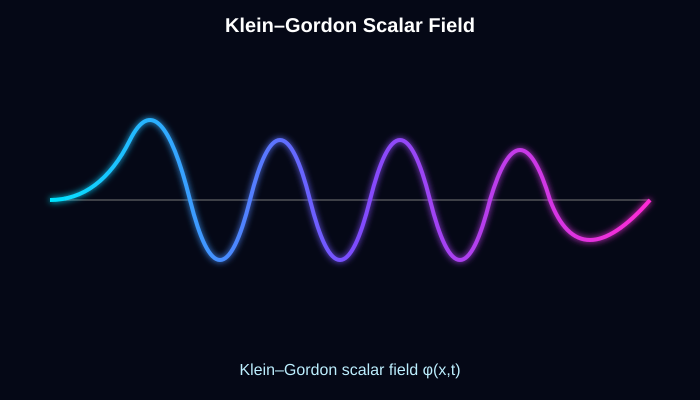

In [49]:
from IPython.display import SVG, display

display(
    SVG(
        filename="QFT_Colorful_SVG/01_Klein_Gordon_Field.svg"
    )
)